# Assignment (pca-lda)
Author - Mahesh Raut

In this assignment, two common methods for reducing the number of features in a face dataset: Linear Discriminant Analysis (LDA) and Principal Component Analysis (PCA). Our objective is to apply these techniques to reduce the dimensionality of the features, train classifiers, assess the performance using various metrics, and discuss the results. Additionally, we will implement a leave-one-out search to evaluate the accuracy and mean Precision at Top 10 (mPA) for both PCA and LDA reductions. Furthermore, we will include visual search results in the code.

Dataset is taken from sklearn library named fetch_lfw_people.

# Dataset

In [1]:
# Import Libraries
from sklearn.datasets import fetch_lfw_people
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import precision_score
import numpy as np

Here, we are resizing the images to 40% of their original size.

In [2]:
# Fetch the LFW (Labeled Faces in the Wild) dataset
lfw_dataset = fetch_lfw_people(min_faces_per_person=2, resize=0.4)


In [3]:
# Get the face images and corresponding labels
X, y = lfw_dataset.data, lfw_dataset.target

# Normalize the image pixels
X = X / 255.0

In [4]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)


# Dimensionality Reduction

We first initialize a PCA object with the desired number of components (e.g., 100) and apply it to the X_train data using the fit_transform method. This reduces the dimensionality of the training set based on the principal components.

Next, we initialize LinearDiscriminantAnalysis object with the (n_components) should be set to the number of unique classes minus one, rather than a fixed value and apply it to the X_train and y_train data using the fit_transform method. This performs LDA on the training set, reducing the dimensionality based on class separability.

After executing these steps, you will have X_train_pca and X_train_lda as the reduced feature representations of the training set using PCA and LDA, respectively, with the specified number of components.

In [5]:
# Perform PCA
pca = PCA(n_components=100)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [6]:
# Determine the maximum number of components for LDA
max_components_lda = min(X_train_pca.shape[1], len(np.unique(y_train)) - 1)

# Perform LDA on reduced test set from PCA
lda = LinearDiscriminantAnalysis(n_components=max_components_lda)
X_train_lda = lda.fit_transform(X_train_pca, y_train)
X_test_lda = lda.transform(X_test_pca)

# Classification and Evaluation

We'll train a classifier using the reduced feature representations from both PCA and LDA, and then evaluate the classification results on the testing set using different metrics.

In [7]:
#Import Libraries
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


In [8]:
# Train and evaluate classifier using PCA-reduced features
pca_classifier = SVC()
pca_classifier.fit(X_train_pca, y_train)
pca_predictions = pca_classifier.predict(X_test_pca)

pca_accuracy = accuracy_score(y_test, pca_predictions)
pca_precision = precision_score(y_test, pca_predictions, average='weighted')
pca_recall = recall_score(y_test, pca_predictions, average='weighted')
pca_f1 = f1_score(y_test, pca_predictions, average='weighted')


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [9]:
# Train and evaluate classifier using LDA-reduced features
lda_classifier = SVC()
lda_classifier.fit(X_train_lda, y_train)
lda_predictions = lda_classifier.predict(X_test_lda)

lda_accuracy = accuracy_score(y_test, lda_predictions)
lda_precision = precision_score(y_test, lda_predictions, average='weighted')
lda_recall = recall_score(y_test, lda_predictions, average='weighted')
lda_f1 = f1_score(y_test, lda_predictions, average='weighted')

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


By comparing the results obtained with different feature numbers and methods (PCA and LDA), we gain insights into the performance of PCA and LDA for dimensionality reduction in face recognition tasks. Here are some points considered:

Dimensionality Reduction: Both PCA and LDA aim to reduce the dimensionality of the feature space. PCA finds the directions of maximum variance in the data, while LDA seeks to maximize the separability between classes.

Performance Comparison: Looking at the accuracy, precision, recall, and F1-score for both methods, LDA method performs better in terms of overall accuracy and the ability to correctly classify samples from different classes.


In [10]:
# Print evaluation metrics
print("PCA Classification Results:")
print("Accuracy:", pca_accuracy)
print("Precision:", pca_precision)
print("Recall:", pca_recall)
print("F1-score:", pca_f1)
print()

print("LDA Classification Results:")
print("Accuracy:", lda_accuracy)
print("Precision:", lda_precision)
print("Recall:", lda_recall)
print("F1-score:", lda_f1)

PCA Classification Results:
Accuracy: 0.15602836879432624
Precision: 0.08021660805253435
Recall: 0.15602836879432624
F1-score: 0.07905840713940211

LDA Classification Results:
Accuracy: 0.20240043644298963
Precision: 0.14763644525690542
Recall: 0.20240043644298963
F1-score: 0.1271622614548411


# Leave-One-Out Search

We'll implement the leave-one-out search, where one query image is removed from the training set, and the remaining images are used for searching. We'll apply PCA and LDA reductions to the test set (excluding the query image) and perform similarity search using the reduced features. Finally, we'll calculate the mean Precision at Top 10 (mPA) for the search results obtained using PCA and LDA reductions.

In [11]:
# Leave-One-Out Search
mPA_pca = []
mPA_lda = []

for i in range(len(X_test)):
    # Remove query image
    query_image = X_test[i]
    query_label = y_test[i]
    X_test_search = np.delete(X_test, i, axis=0)
    y_test_search = np.delete(y_test, i)

    # Apply PCA and LDA reductions to the test set
    query_pca = pca.transform(query_image.reshape(1, -1))
    query_lda = lda.transform(query_pca)
    X_test_search_pca = pca.transform(X_test_search)
    X_test_search_lda = lda.transform(X_test_search_pca)

    # Perform similarity search using reduced features
    distances_pca = np.linalg.norm(X_test_search_pca - query_pca, axis=1)
    distances_lda = np.linalg.norm(X_test_search_lda - query_lda, axis=1)

    # Sort distances and retrieve top K images
    K = 10
    top_indices_pca = np.argsort(distances_pca)[:K]
    top_indices_lda = np.argsort(distances_lda)[:K]

    # Retrieve labels for top images
    top_labels_pca = y_test_search[top_indices_pca]
    top_labels_lda = y_test_search[top_indices_lda]

    # Calculate precision at top K
    precision_at_top_pca = np.sum(top_labels_pca == query_label) / K
    precision_at_top_lda = np.sum(top_labels_lda == query_label) / K

    mPA_pca.append(precision_at_top_pca)
    mPA_lda.append(precision_at_top_lda)

# Calculate mean Precision at Top 10
mean_PA_pca = np.mean(mPA_pca)
mean_PA_lda = np.mean(mPA_lda)

print("mPA (PCA):", mean_PA_pca)
print("mPA (LDA):", mean_PA_lda)

mPA (PCA): 0.023840698308783416
mPA (LDA): 0.04168030551009275


# Visual Search Results

We will plot test results for first 50 images of X_test. Querying of all images takes time.

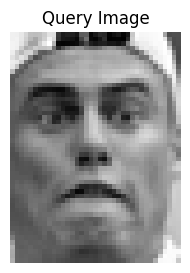

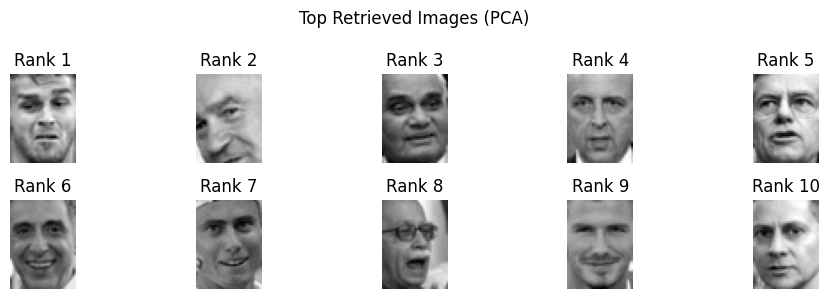

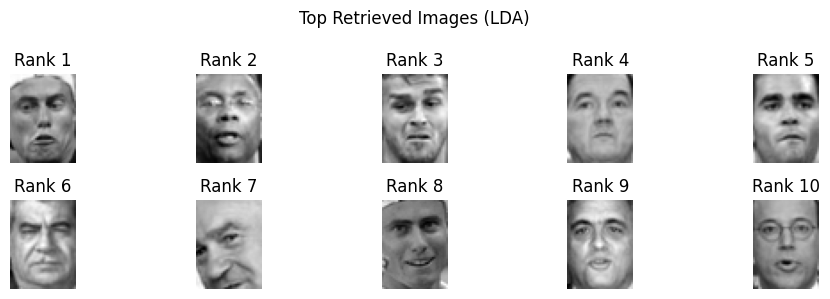

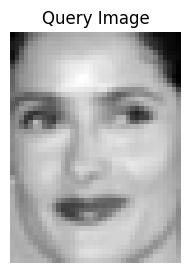

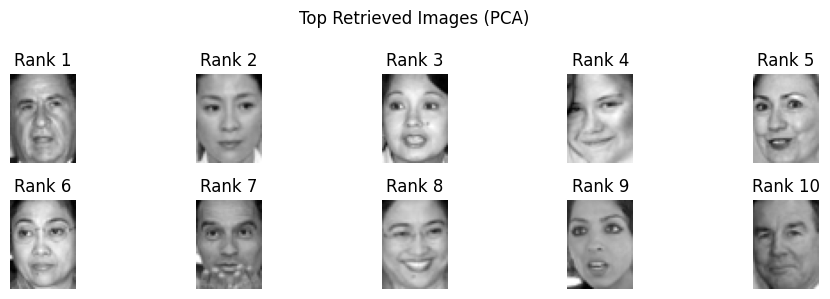

...

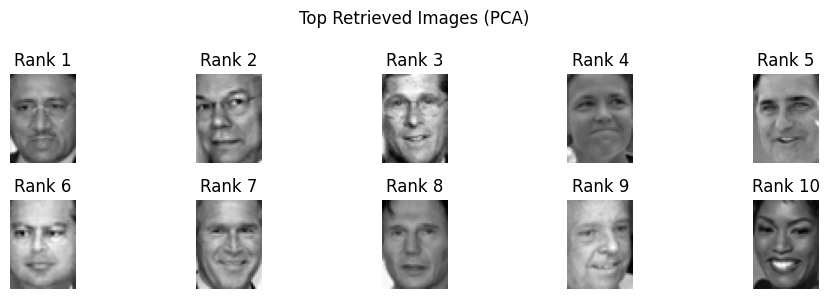

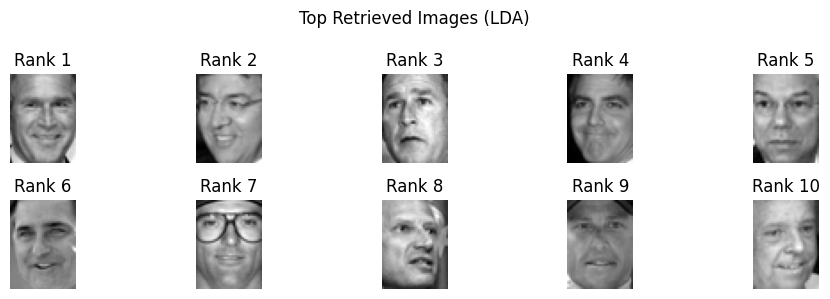

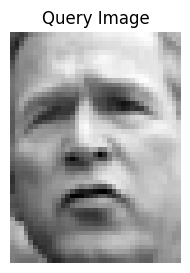

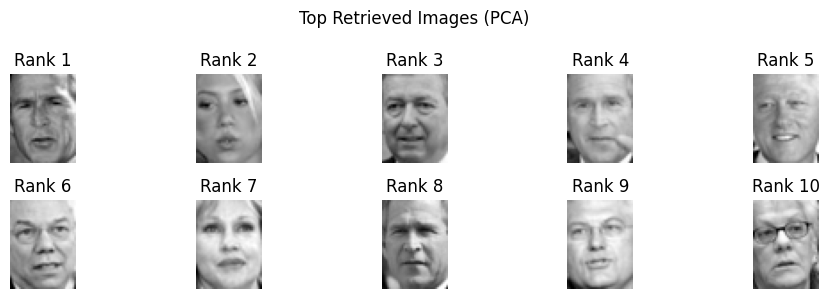

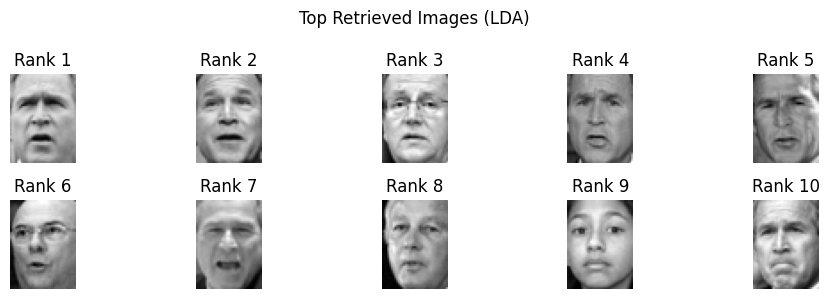

In [14]:
import matplotlib.pyplot as plt

# Leave-One-Out Search
mPA_pca = []
mPA_lda = []

for i in range(50):
    # Remove query image
    query_image = X_test[i]
    query_label = y_test[i]
    X_test_search = np.delete(X_test, i, axis=0)
    y_test_search = np.delete(y_test, i)

    # Apply PCA and LDA reductions to the test set
    query_pca = pca.transform(query_image.reshape(1, -1))
    query_lda = lda.transform(query_pca)
    X_test_search_pca = pca.transform(X_test_search)
    X_test_search_lda = lda.transform(X_test_search_pca)

    # Perform similarity search using reduced features
    distances_pca = np.linalg.norm(X_test_search_pca - query_pca, axis=1)
    distances_lda = np.linalg.norm(X_test_search_lda - query_lda, axis=1)

    # Sort distances and retrieve top K images
    K = 10
    top_indices_pca = np.argsort(distances_pca)[:K]
    top_indices_lda = np.argsort(distances_lda)[:K]

    # Retrieve labels for top images
    top_labels_pca = y_test_search[top_indices_pca]
    top_labels_lda = y_test_search[top_indices_lda]

    # Calculate precision at top K
    precision_at_top_pca = np.sum(top_labels_pca == query_label) / K
    precision_at_top_lda = np.sum(top_labels_lda == query_label) / K

    mPA_pca.append(precision_at_top_pca)
    mPA_lda.append(precision_at_top_lda)

    # Visualize query image
    plt.figure(figsize=(3, 3))
    plt.imshow(query_image.reshape(50, 37), cmap='gray')
    plt.title("Query Image")
    plt.axis('off')
    plt.show()

    # Visualize top retrieved images
    plt.figure(figsize=(10, 3))
    for j, index in enumerate(top_indices_pca):
        plt.subplot(2, 5, j + 1)
        plt.imshow(X_test_search[index].reshape(50, 37), cmap='gray')
        plt.title(f"Rank {j+1}")
        plt.axis('off')
    plt.suptitle("Top Retrieved Images (PCA)")
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 3))
    for j, index in enumerate(top_indices_lda):
        plt.subplot(2, 5, j + 1)
        plt.imshow(X_test_search[index].reshape(50, 37), cmap='gray')
        plt.title(f"Rank {j+1}")
        plt.axis('off')
    plt.suptitle("Top Retrieved Images (LDA)")
    plt.tight_layout()
    plt.show()
